In [2]:
import pandas as pd
import numpy as np
import math as ma
import matplotlib.pyplot as plt

from pybrain.structure import FeedForwardNetwork
from pybrain.structure import LinearLayer, TanhLayer, FullConnection
from pybrain.supervised.trainers import BackpropTrainer
from pybrain.datasets import SupervisedDataSet
from pybrain.tools.customxml.networkwriter import NetworkWriter
from pybrain.tools.customxml.networkreader import NetworkReader
from pybrain.tools.shortcuts import buildNetwork
from pybrain.utilities import percentError
from sklearn import preprocessing

from sklearn.preprocessing import normalize

min_max_scaler = preprocessing.MinMaxScaler()

In [3]:
Apro=pd.read_csv("Apro.csv")
Aval=pd.read_csv("Aval.csv")
Atra=pd.read_csv("Atra.csv")
Amom=pd.read_csv("Amom.csv")
Afd=pd.read_csv("Afd.csv")
Atec=pd.read_csv("Atec.csv")

In [13]:
def fnn3(frame,string):
    df=frame.dropna(axis=0,how='any')
    name=string
    nm1=name+"tst1.png"
    nm2=name+"cov1.png"
    x=df.drop(columns=['gvkey','date','price'])
    x=np.array(x)
    x=normalize(x, axis=0, norm='max')
    y=np.array(df['ret'])
    x=np.delete(x,1,axis=1)
    xdim=x.shape[1]
    ydim=1
    DS=SupervisedDataSet(xdim,ydim)
    for i in range(len(x)):
        DS.addSample(x[i],y[i])
    dataTrain, dataTest = DS.splitWithProportion(0.8)
    dataPlot, datadrop =DS.splitWithProportion(0.002)
    xTrain, yTrain = dataTrain['input'],dataTrain['target']
    xTest, yTest = dataTest['input'], dataTest['target']
    xPlot, yPlot= dataPlot['input'], dataPlot['target']
    fnn=buildNetwork(xdim,xdim+1,xdim+2,int(0.5*(xdim+1)),ydim,hiddenclass=TanhLayer,outclass=LinearLayer)
    trainer=BackpropTrainer(fnn,dataTrain,learningrate=0.000000001,verbose=True)
    err_train, err_valid =trainer.trainUntilConvergence(maxEpochs=100)
    
    tstresult = percentError( trainer.testOnClassData(), dataTest['target'] )
    print("epoch: %4d" % trainer.totalepochs, " test error: %5.2f%%" % tstresult)
    
    predict_resutl=[]
    for i in np.arange(len(xPlot)):
        predict_resutl.append(fnn.activate(xPlot[i])[0])
    print(predict_resutl)
    
    #yTest2=yTest([0:len(yTest):12])
    #pred2=predict_resutl([0:len(predict_resutl):12])
    
    plt.figure(figsize=(30,6), dpi=600)
    plt.xlabel("Test Timeline")
    plt.ylabel("Result")
    plt.plot(np.arange(0,len(xPlot)), yPlot,'ko-', label='true number')
    plt.plot(np.arange(0,len(xPlot)), predict_resutl,'ro--', label='predict number')
    lgnd1=plt.legend()
    plt.savefig(nm1,dpi=600, bbox_extra_artists=(lgnd1))
    
    plt.figure(figsize=(9,9), dpi=600)
    plt.plot(err_train,'b',label='train_err')
    plt.plot(err_valid,'r',label='valid_err')
    plt.xlabel("Training Times")
    plt.ylabel("Total Error")
    lgnd2=plt.legend()
    plt.savefig(nm2,dpi=600, bbox_extra_artists=(lgnd2))
    plt.show()
    
    return

Total error:  0.0151254700512
Total error:  0.0129815774487
Total error:  0.012186590632
Total error:  0.0115918643439
Total error:  0.0111438622585
Total error:  0.0108012387727
Total error:  0.0105380633366
Total error:  0.0103330943212
Total error:  0.0101729479785
Total error:  0.0100458290896
Total error:  0.0099439735365
Total error:  0.00986213405235
Total error:  0.00979451596858
Total error:  0.00973773243584
Total error:  0.00969075880961
Total error:  0.00964983213069
Total error:  0.00961470046306
Total error:  0.00958391305857
Total error:  0.00955606636503
Total error:  0.00953066952484
Total error:  0.00950776553891
Total error:  0.00948608134974
Total error:  0.00946629135564
Total error:  0.00944685071774
Total error:  0.00942902208683
Total error:  0.00941222200484
Total error:  0.00939523728571
Total error:  0.00937995864518
Total error:  0.0093644272188
Total error:  0.00934953658172
Total error:  0.00933495027447
Total error:  0.00932091135201
Total error:  0.00930

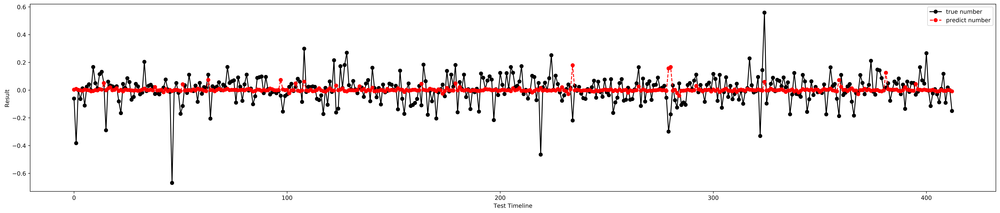

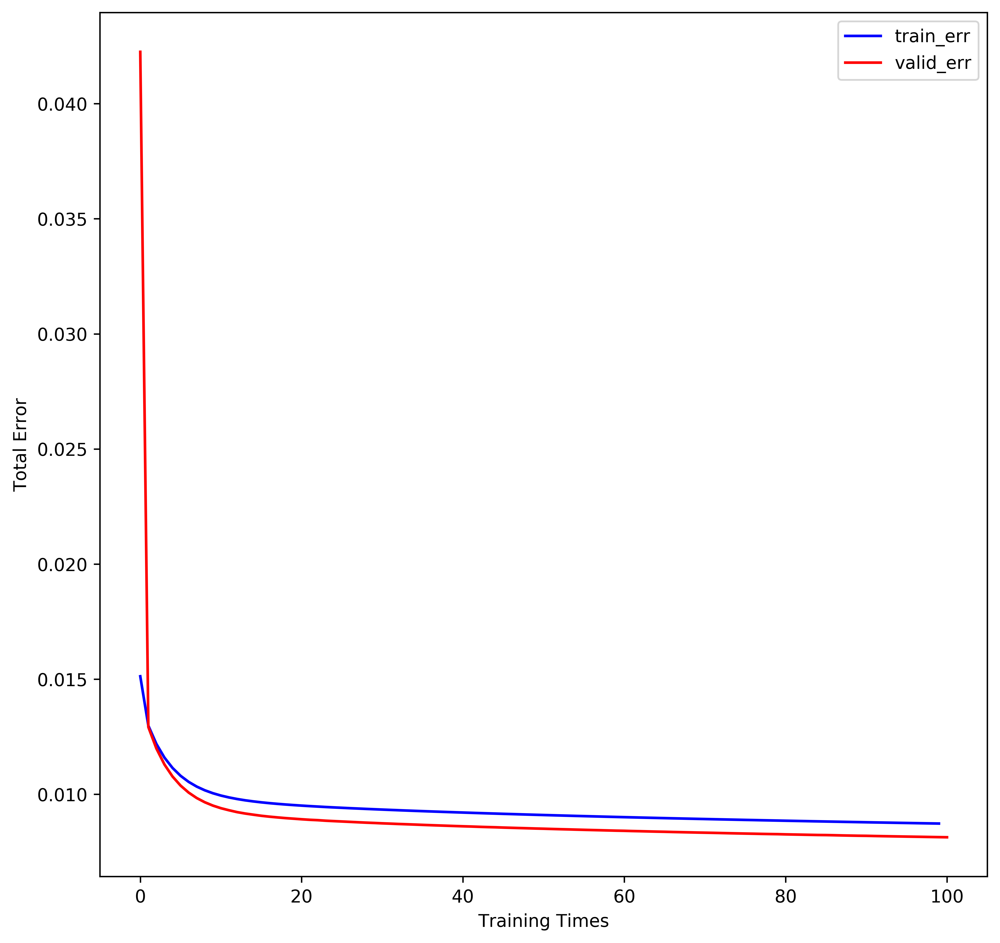

In [14]:
fnn3(Apro,"Apro")

Total error:  0.0110891789604
Total error:  0.00709570499946
Total error:  0.00695190859929
Total error:  0.00680581220597
Total error:  0.00665659202432
Total error:  0.00650306430549
Total error:  0.00634396101309
Total error:  0.00617800844142
Total error:  0.00600366176048
Total error:  0.00582048890326
Total error:  0.00562822955344
Total error:  0.00542743675218
Total error:  0.00521940102013
Total error:  0.00500700993874
Total error:  0.0047931771494
Total error:  0.00458197001566
Total error:  0.00437710010867
Total error:  0.0041824501115
Total error:  0.00400052680819
Total error:  0.00383318524677
Total error:  0.00368098309218
Total error:  0.00354396155685
Total error:  0.00342098493591
Total error:  0.00331053868174
Total error:  0.00321186971814
Total error:  0.00312290819995
Total error:  0.00304255245097
Total error:  0.00296976272537
Total error:  0.0029036113221
Total error:  0.00284325443665
Total error:  0.002787974904
Total error:  0.00273738434038
Total error:  

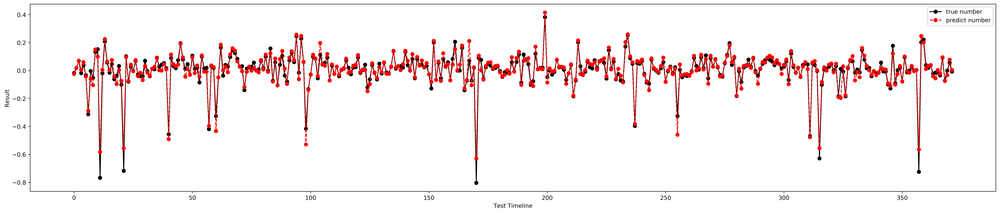

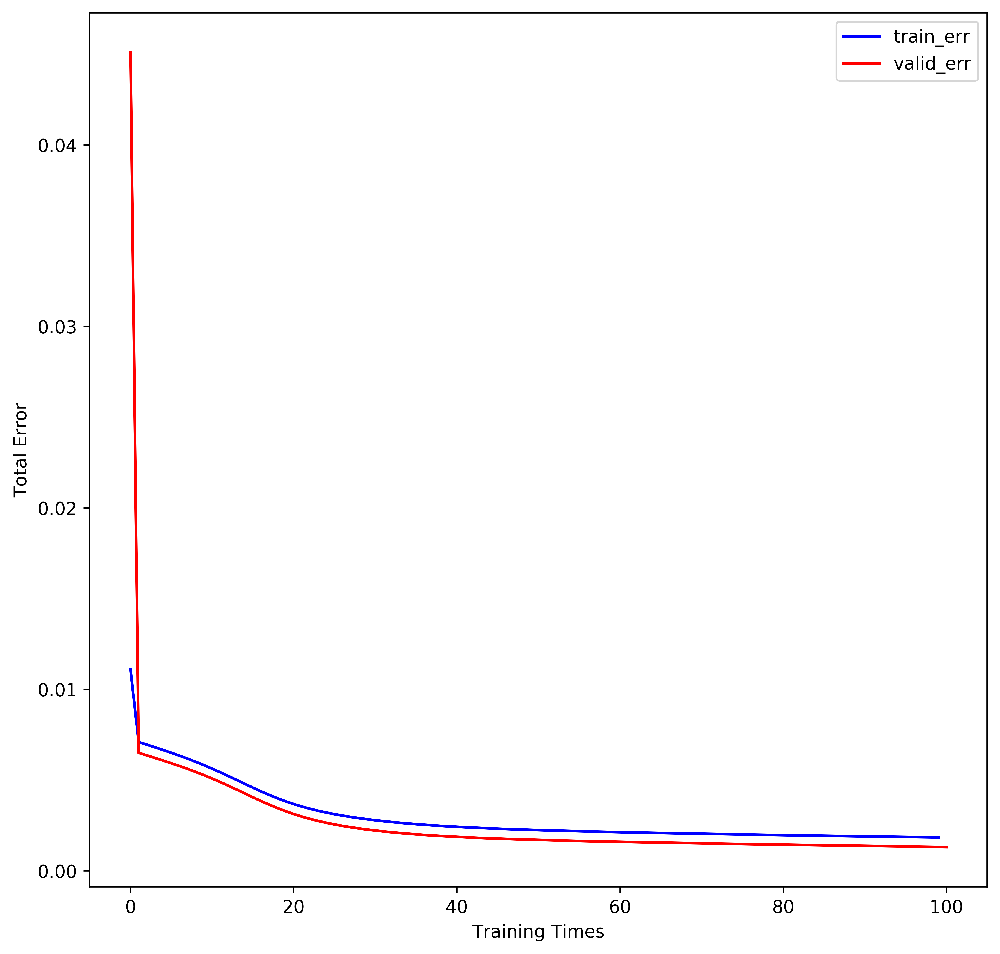

In [15]:
fnn3(Aval,"Aval")

Total error:  0.0293723060117
Total error:  0.00783602498966
Total error:  0.00776146886913
Total error:  0.00768519335459
Total error:  0.00760650522636
Total error:  0.00752550767045
Total error:  0.00744205202234
Total error:  0.00735592721918
Total error:  0.00726742487144
Total error:  0.00717603014845
Total error:  0.00708241933732
Total error:  0.00698574598119
Total error:  0.00688642529723
Total error:  0.0067847693933
Total error:  0.00668059622959
Total error:  0.00657466176801
Total error:  0.00646598147335
Total error:  0.00635551631925
Total error:  0.00624357944846
Total error:  0.00613027298802
Total error:  0.00601565461479
Total error:  0.00590023299639
Total error:  0.00578441138493
Total error:  0.00566860961367
Total error:  0.00555270287343
Total error:  0.00543752266699
Total error:  0.00532310836541
Total error:  0.00520970261061
Total error:  0.00509749372739
Total error:  0.00498722559346
Total error:  0.00487851889006
Total error:  0.00477226371216
Total erro

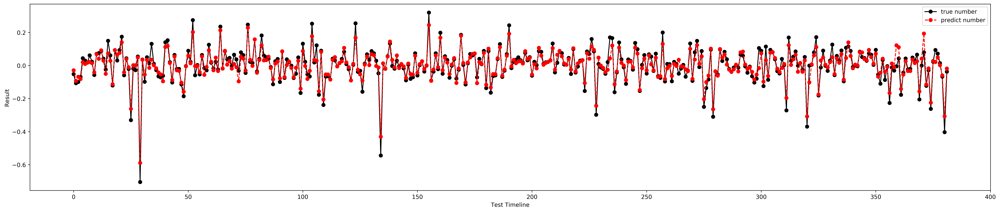

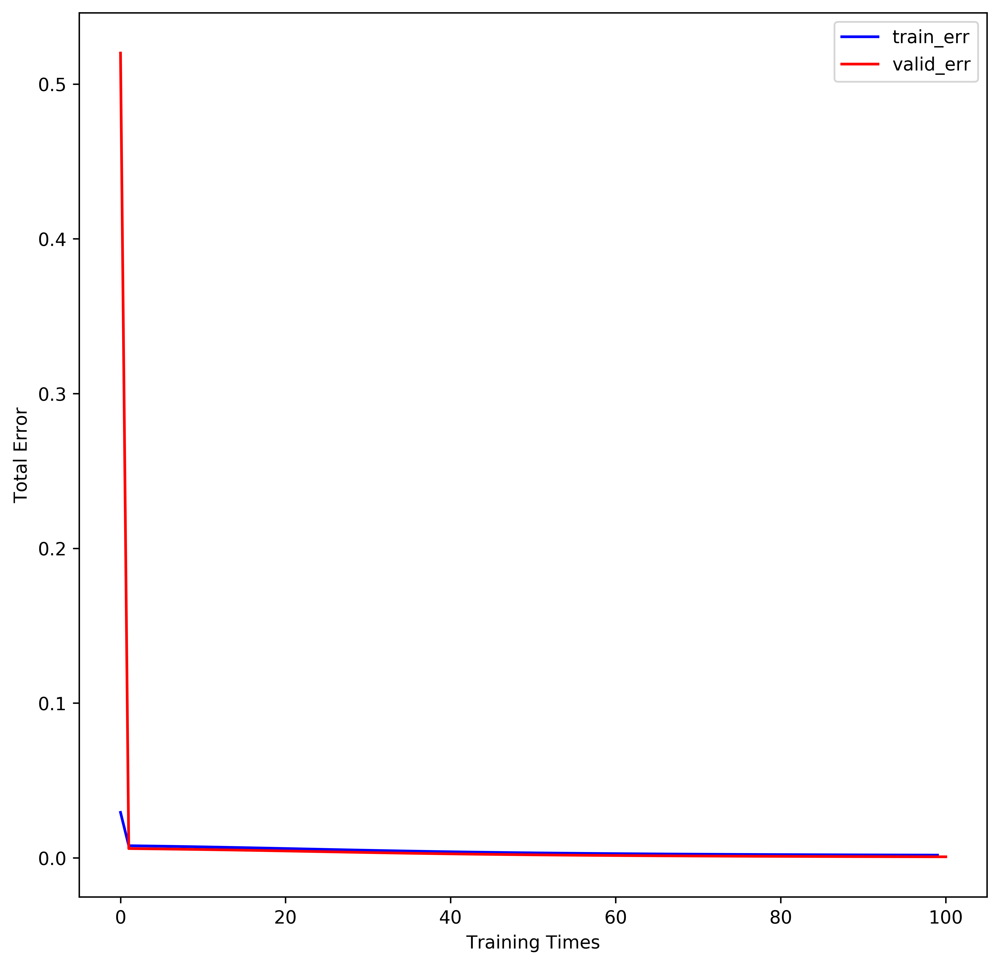

In [19]:
fnn3(Amom,"Amom")

Total error:  0.0156334216301
Total error:  0.0109330794808
Total error:  0.0105128397917
Total error:  0.0101282131876
Total error:  0.00977376413069
Total error:  0.00944505871283
Total error:  0.009138487258
Total error:  0.00885090892186
Total error:  0.00858047552818
Total error:  0.00832570681397
Total error:  0.00808643597461
Total error:  0.00786355197328
Total error:  0.00765842138103
Total error:  0.00747185057091
Total error:  0.00730384585052
Total error:  0.00715284340276
Total error:  0.00701630089803
Total error:  0.00689114638414
Total error:  0.00677424277174
Total error:  0.00666312756652
Total error:  0.00655487931771
Total error:  0.0064479040867
Total error:  0.00634067712375
Total error:  0.00623230898199
Total error:  0.00612241724054
Total error:  0.00601069178394
Total error:  0.00589798791895
Total error:  0.00578471159486
Total error:  0.00567168392538
Total error:  0.00555986925819
Total error:  0.00544990760309
Total error:  0.00534228092778
Total error:  0

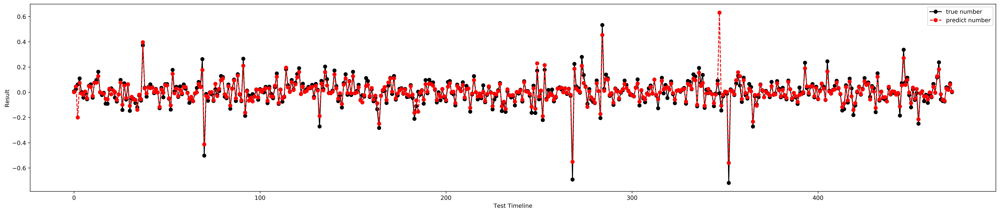

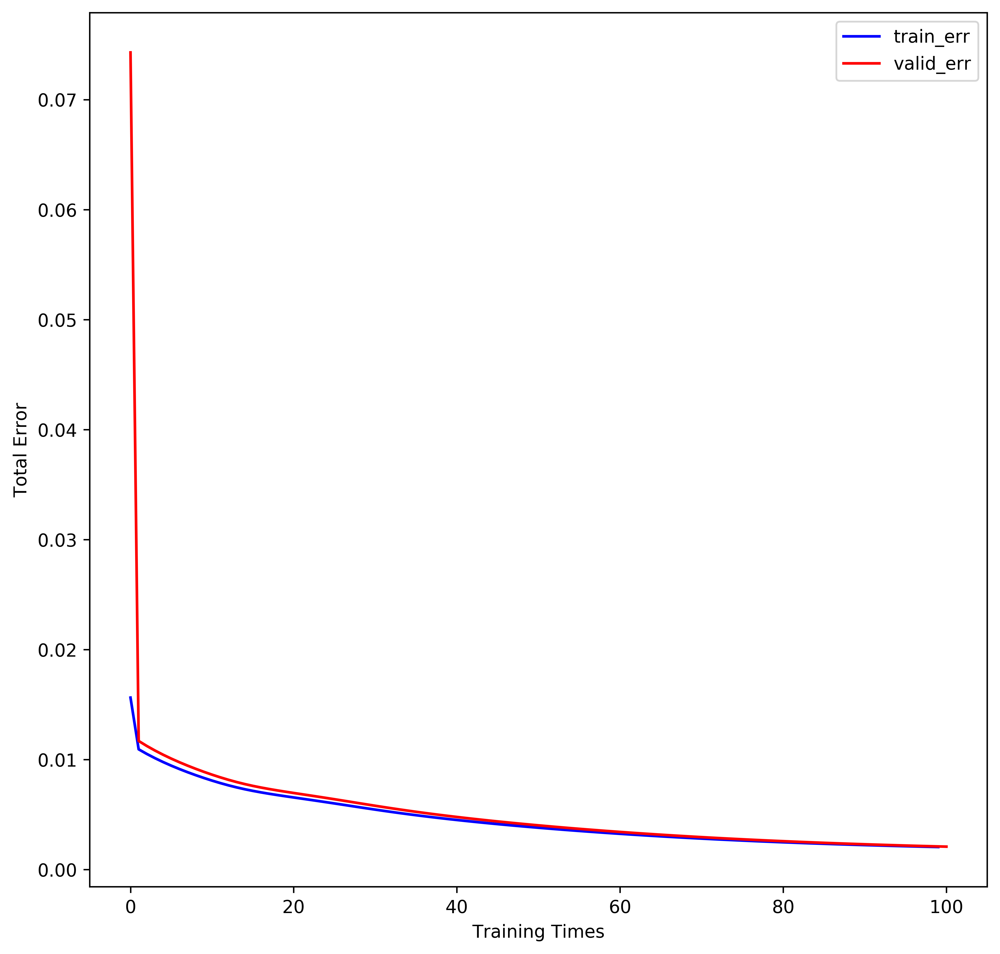

In [23]:
fnn3(Atra,"Atra")

Total error:  0.0574968555168
Total error:  0.011886931668
Total error:  0.0102023810283
Total error:  0.00963557700043
Total error:  0.00935759470453
Total error:  0.00919386902388
Total error:  0.00908587138207
Total error:  0.00900916406868
Total error:  0.00895125756149
Total error:  0.00890584200659
Total error:  0.00886906395299
Total error:  0.00883826223212
Total error:  0.00881221538652
Total error:  0.00878934325296
Total error:  0.00876914970315
Total error:  0.008751531946
Total error:  0.00873524315398
Total error:  0.0087203133754
Total error:  0.00870665780295
Total error:  0.00869349186133
Total error:  0.00868183860824
Total error:  0.00867083052688
Total error:  0.00866015759701
Total error:  0.00864991095249
Total error:  0.00864030744233
Total error:  0.00863116198266
Total error:  0.00862214738115
Total error:  0.00861352446941
Total error:  0.00860522106433
Total error:  0.0085973083028
Total error:  0.0085894064183
Total error:  0.00858173745469
Total error:  0.0

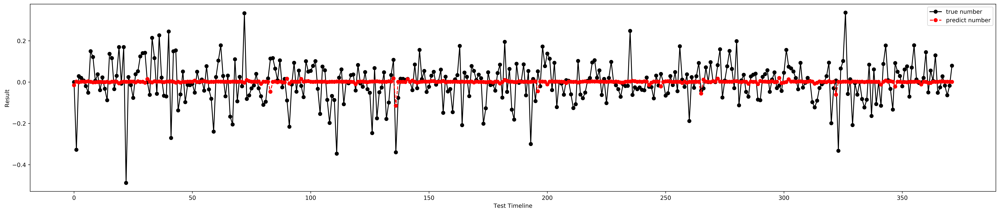

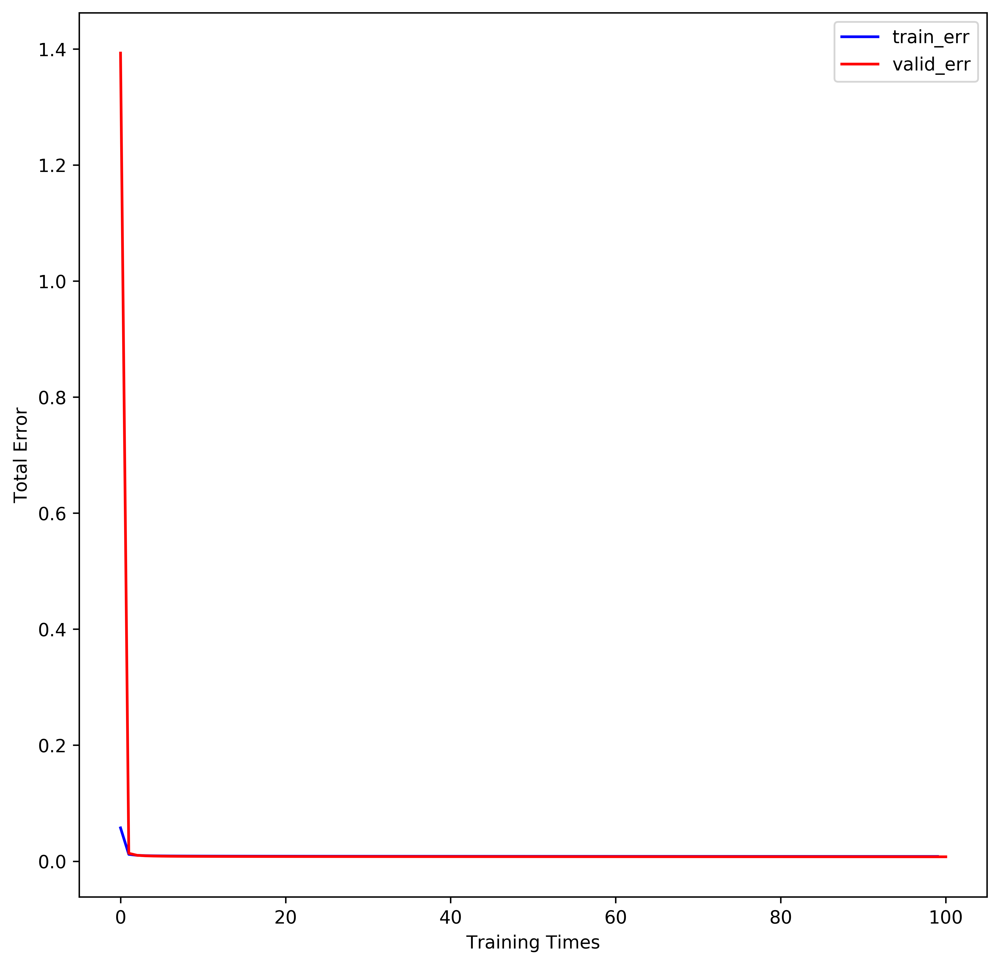

In [22]:
fnn3(Afd,"Afd")

Total error:  0.368887736627
Total error:  0.00841257669828
Total error:  0.00835837639674
Total error:  0.00830704048521
Total error:  0.00825625092178
Total error:  0.00820661761021
Total error:  0.00815691024481
Total error:  0.00810730288213
Total error:  0.00805700926742
Total error:  0.00800574390424
Total error:  0.00795313374892
Total error:  0.0078984820308
Total error:  0.00784181831349
Total error:  0.0077819798239
Total error:  0.00771888631719
Total error:  0.00765148973098
Total error:  0.00757969012045
Total error:  0.00750255609912
Total error:  0.00741923886192
Total error:  0.00732880794666
Total error:  0.00723074980525
Total error:  0.00712406801288
Total error:  0.00700804318635
Total error:  0.00688222672651
Total error:  0.00674615032384
Total error:  0.00660003542807
Total error:  0.00644413949925
Total error:  0.00627997653197
Total error:  0.00610899972054
Total error:  0.00593322611715
Total error:  0.00575544232899
Total error:  0.00557802551772
Total error:

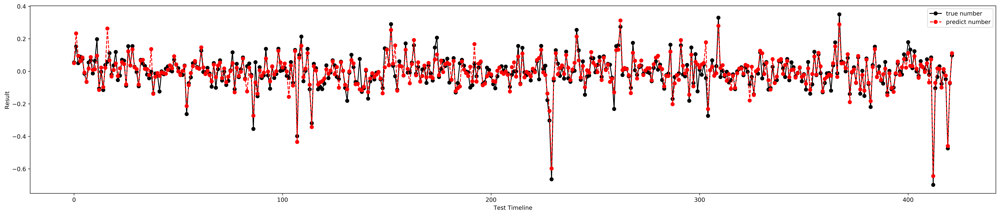

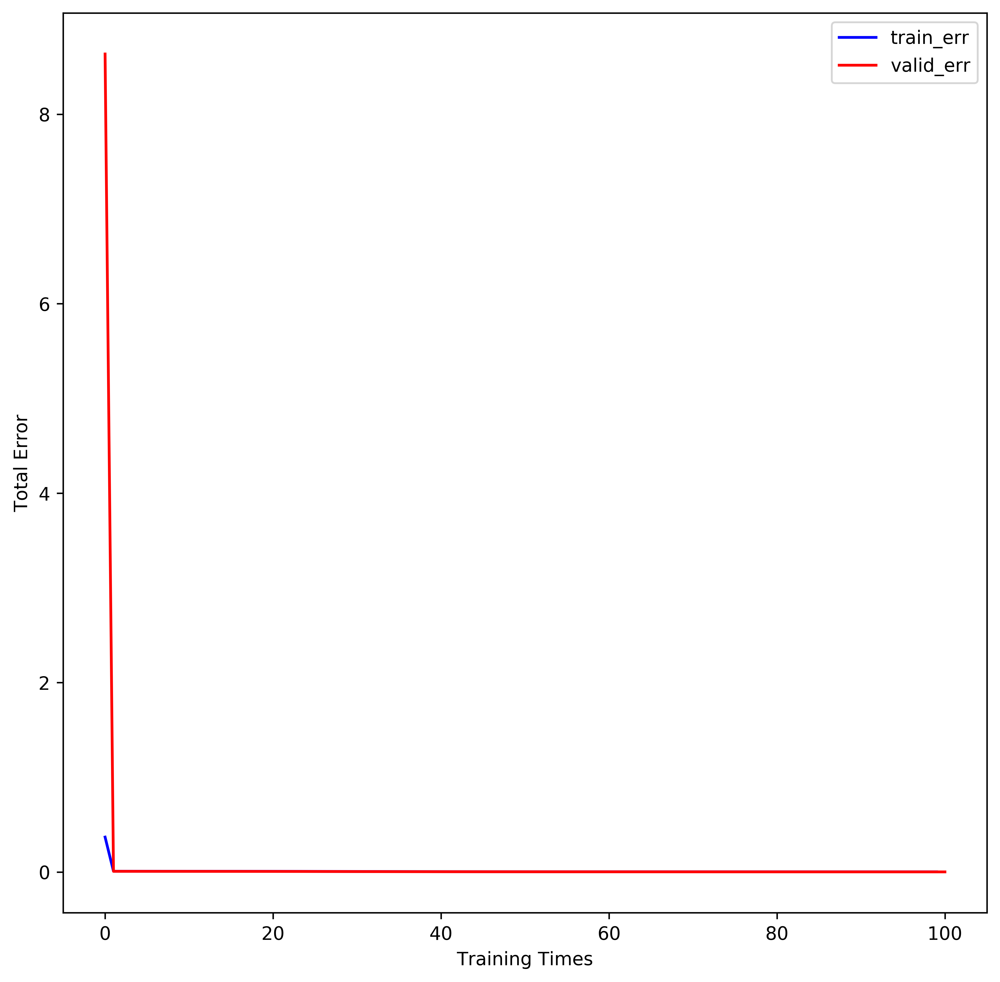

In [21]:
fnn3(Atec,"Atec")